In [7]:
import sys
import numpy as np
import pygplates
from create_gpml import create_gpml_regular_long_lat_mesh
import points_spatial_tree
from polygon_processing import run_grid_pnp
import matplotlib.pyplot as plt

%matplotlib inline



In [8]:

# function to run point in/near polygon test for two successive time slices
def interpolate_paleoshoreline_for_stage(psl,t1,t2,time_step,points,
                                         spatial_tree_of_uniform_recon_points,rotation_model,plot=False):
    
    print 'Working on interpolation from %0.2f Ma to %0.2f Ma .....' % (t1,t2)
    
    distance_to_land_t1,distance_to_psl_t1 = run_grid_pnp(t1,
                                                          points,
                                                          spatial_tree_of_uniform_recon_points,
                                                          psl,
                                                          rotation_model)
    
    distance_to_land_t2,distance_to_psl_t2 = run_grid_pnp(t2,
                                                          points,
                                                          spatial_tree_of_uniform_recon_points,
                                                          psl, 
                                                          rotation_model)
    
    # this mask is true where one (and only one) of the indicators is not zero
    # --> delineates points that change environment between time steps
    #msk = np.logical_xor(distance_to_land_t1,distance_to_land_t2)
    
    regression_msk = np.logical_and(distance_to_land_t1==0,distance_to_land_t2>0)
    
    transgression_msk = np.logical_and(distance_to_land_t1>0,distance_to_land_t2==0)
    
    always_land_msk = np.logical_and(distance_to_land_t1==0,distance_to_land_t2==0)

    # normalised distance derivation
    # for each point, divide the distance to shoreline at t0 by the total distance to both shorelines
    # --> if the point is halfway between the shorelines, value will be 0.5
    #     if the point is closer to the t1 shoreline, the value will be less than 0.5
    #     all values will be between 0 and 1
    psl_dist_norm = np.divide(distance_to_psl_t1,(distance_to_psl_t1+distance_to_psl_t2))

    
    t_diff = (t2-t1)
    
    
    coords = zip(*[point.to_lat_lon() for point in points])
    plt.figure(figsize=(20,9))
    plt.scatter(np.array(coords[1]),np.array(coords[0]),c=distance_to_land_t1,
                edgecolors='',s=2,alpha=0.5)
    #plt.plot(np.array(coords[1])[transgression_msk],np.array(coords[0])[transgression_msk],'b.',markersize=3,alpha=0.3)
    #plt.plot(np.array(coords[1])[regression_msk],np.array(coords[0])[regression_msk],'r.',markersize=3,alpha=0.3)
    plt.title('%0.2f - %0.2f Ma' % (t1,t2))
    plt.colorbar()
    plt.show()
    
    coords = zip(*[point.to_lat_lon() for point in points])
    plt.figure(figsize=(20,9))
    plt.scatter(np.array(coords[1]),np.array(coords[0]),c=distance_to_psl_t1,
                edgecolors='',s=2,alpha=0.5)
    #plt.plot(np.array(coords[1])[transgression_msk],np.array(coords[0])[transgression_msk],'b.',markersize=3,alpha=0.3)
    #plt.plot(np.array(coords[1])[regression_msk],np.array(coords[0])[regression_msk],'r.',markersize=3,alpha=0.3)
    plt.title('%0.2f - %0.2f Ma' % (t1,t2))
    plt.colorbar()
    plt.show()
    
    
    # don't need to do t2 itself, since this will be first step in next iteration
    for reconstruction_time in np.arange(t1,t2,time_step):
        
        if reconstruction_time==t1:
            land_points = np.where(distance_to_land_t1==0)[0]
            print land_points.shape
        else:
            t_norm = (reconstruction_time-t1)/t_diff
            #land_points = np.where(t_norm)
            is_transgressing_land_msk = np.less_equal(psl_dist_norm,t_norm)
            
            is_regressing_land_msk = np.greater_equal(psl_dist_norm,t_norm)
            
            land_points = np.where(
                np.logical_or(
                    np.logical_or(
                        np.logical_and(is_regressing_land_msk,regression_msk),
                        np.logical_and(is_transgressing_land_msk,transgression_msk)
                    ),
                always_land_msk))[0]

        if plot:
            
            plt.figure(figsize=(20,9))
            coords = zip(*[point.to_lat_lon() for point in points])
            #plt.plot(np.array(coords[1])[always_land_msk],np.array(coords[0])[always_land_msk],'k.',markersize=3,alpha=0.3)
            plt.plot(np.array(coords[1])[land_points],np.array(coords[0])[land_points],'k.',markersize=3,alpha=0.3)
            #plt.scatter(np.array(coords[1])[land_points],np.array(coords[0])[land_points],
            #        c=psl_dist_norm,edgecolors='',s=2)
            #plt.colorbar()
            plt.title('%0.2fMa' % reconstruction_time)
            plt.savefig('./tmp/interpolated_psl_%0.2fMa.png' % reconstruction_time)
            plt.close()
        

# function that takes a list of 2 or more paleoshorelines, and iteratively
# interpolates each successive stage
def interpolate_paleoshoreline_collection(psl,rotation_model,sampling=0.5,time_step=1.):

    # create a grid of uniform points as a spatial tree - this only needs to be done once
    # to cover all time steps
    lons,lats = np.meshgrid(np.arange(-180,180+sampling,sampling),np.arange(-90,90+sampling,sampling))
    points = [pygplates.PointOnSphere(lat, lon) for lat, lon in zip(lats.flatten(),lons.flatten())]

    spatial_tree_of_uniform_recon_points = points_spatial_tree.PointsSpatialTree(points)

    # from the paleoshorelines, capture a list of times (rounded to nearest Myr)
    time_list = []
    for feature in psl:
        time_list.append(np.round(np.mean(feature.get_valid_time())))

    time_list.sort()
    
    print 'List of times is:'
    print time_list

    # iterate over each succesive pair of times in list inferred from paleoshoreline features
    for (t1,t2) in zip(time_list[:-1],time_list[1:]):
        
        # call function to interpolate between current pair of times
        interpolate_paleoshoreline_for_stage(psl,t1,t2,time_step,points,
                                             spatial_tree_of_uniform_recon_points,rotation_model,plot=True)
        
        #if t1>10:
        #    break
    

List of times is:
[7.0, 17.0, 26.0, 33.0, 43.0, 54.0, 71.0, 91.0, 110.0, 131.0, 143.0]
Working on interpolation from 7.00 Ma to 17.00 Ma .....


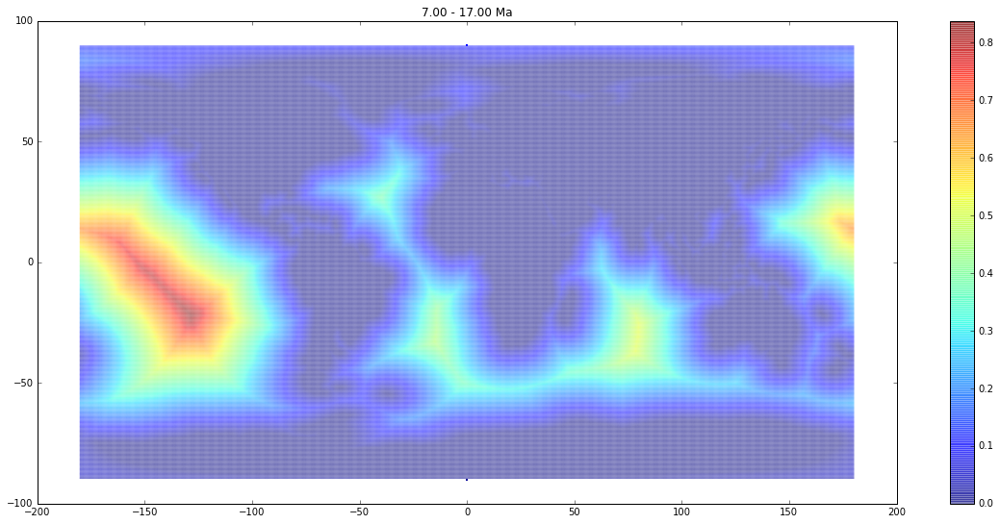

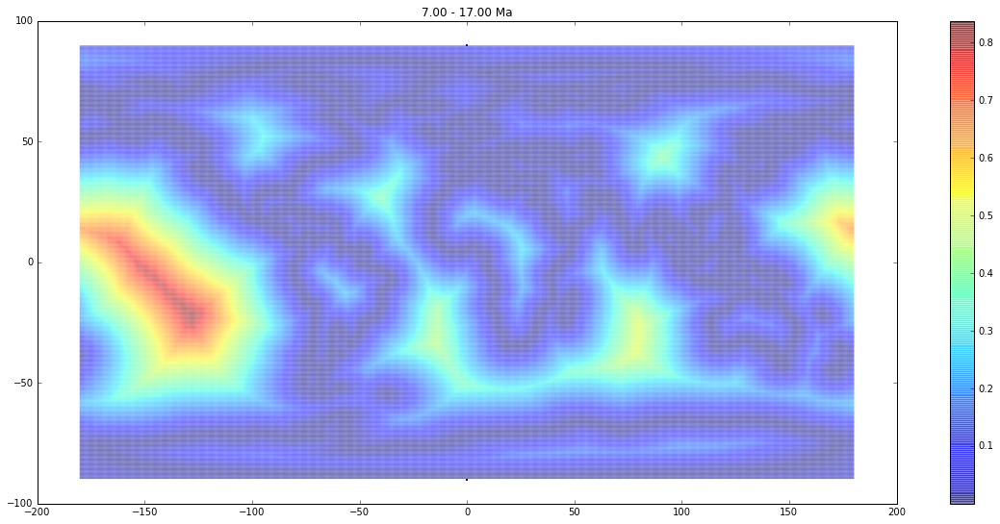

(90548,)
Working on interpolation from 17.00 Ma to 26.00 Ma .....


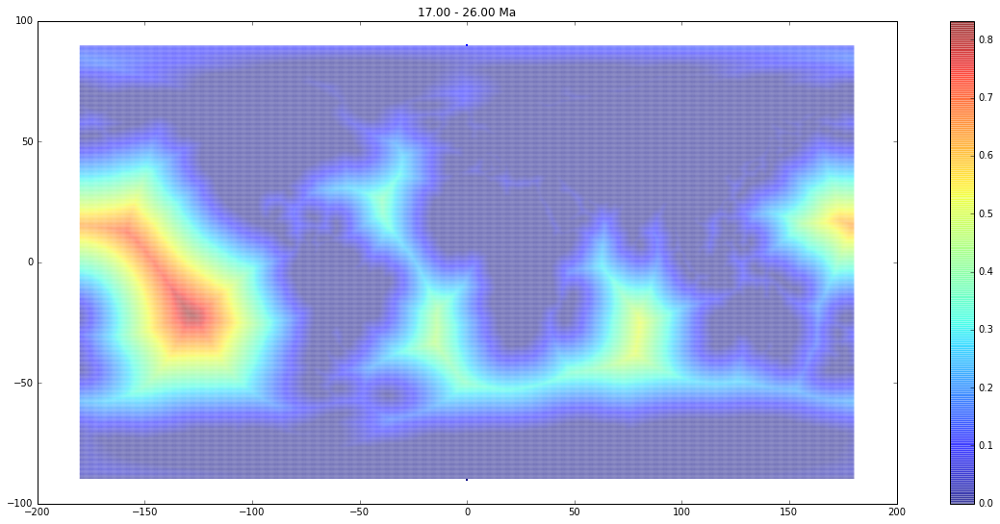

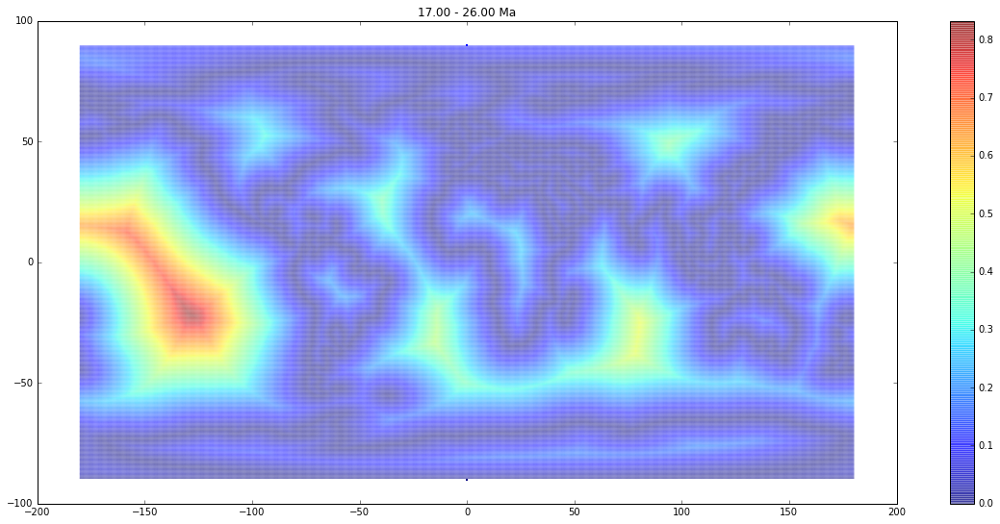

(91432,)
Working on interpolation from 26.00 Ma to 33.00 Ma .....


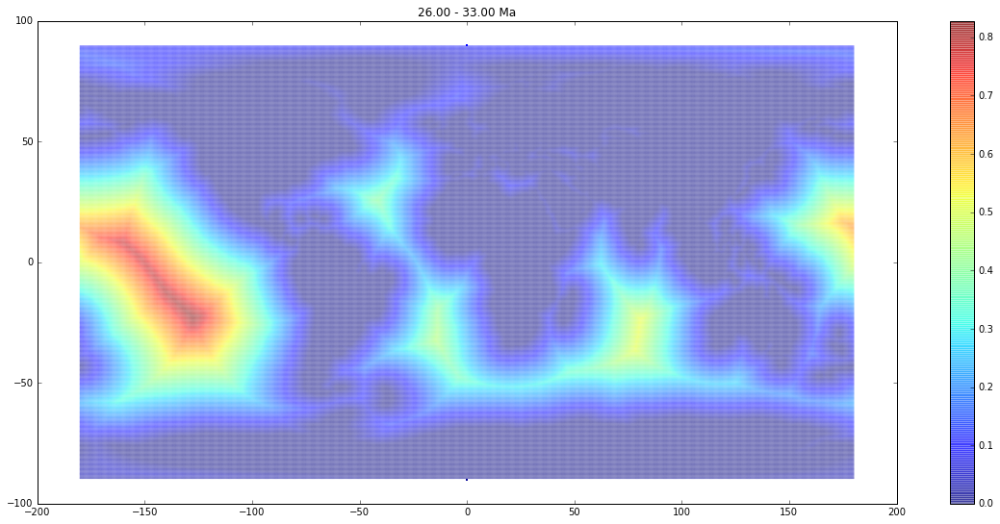

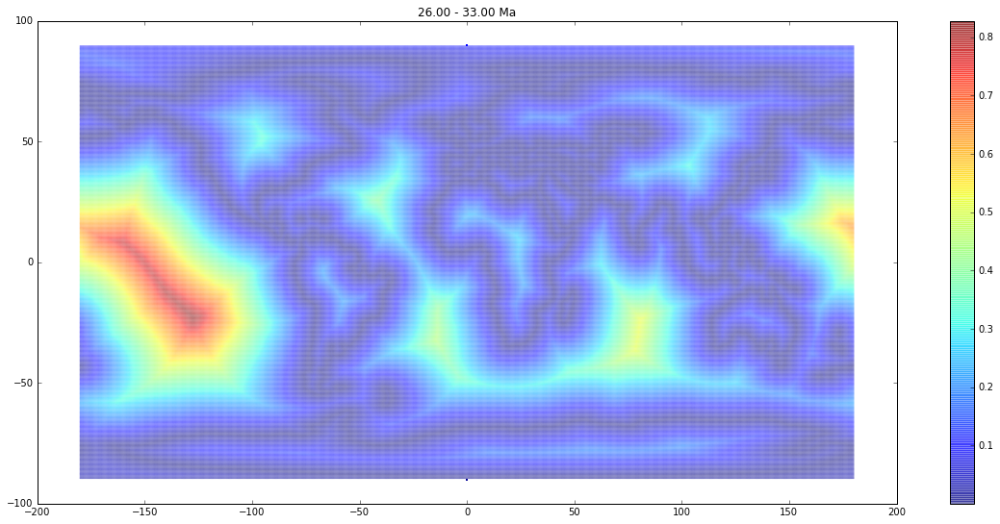

(88643,)
Working on interpolation from 33.00 Ma to 43.00 Ma .....


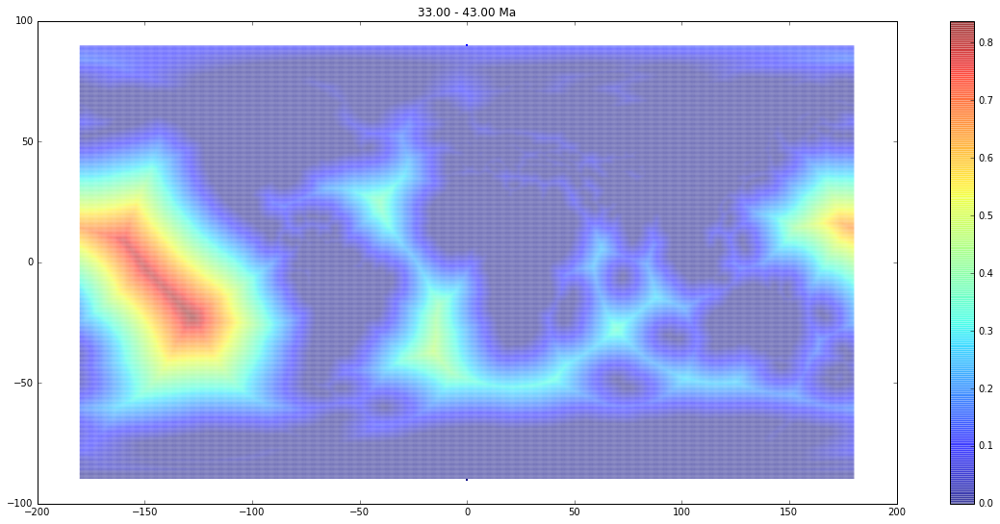

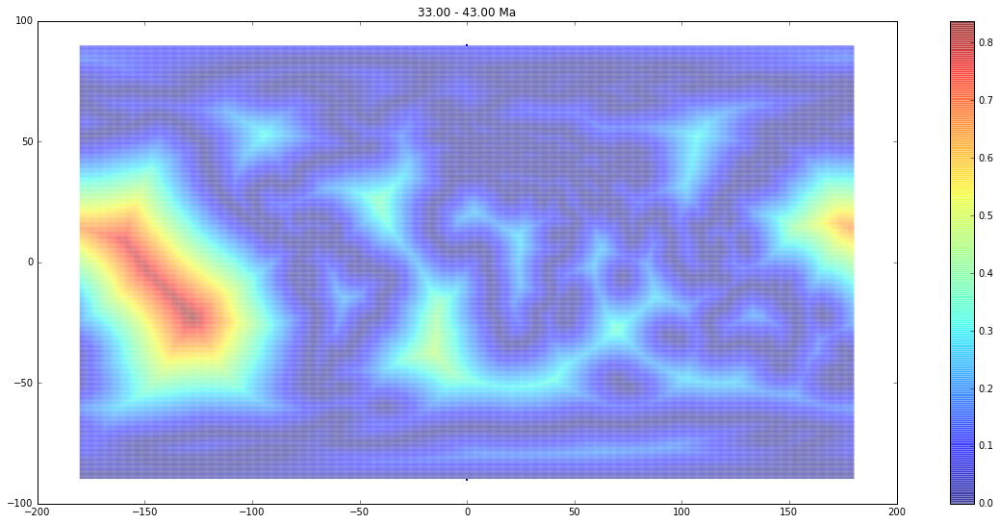

(88692,)
Working on interpolation from 43.00 Ma to 54.00 Ma .....


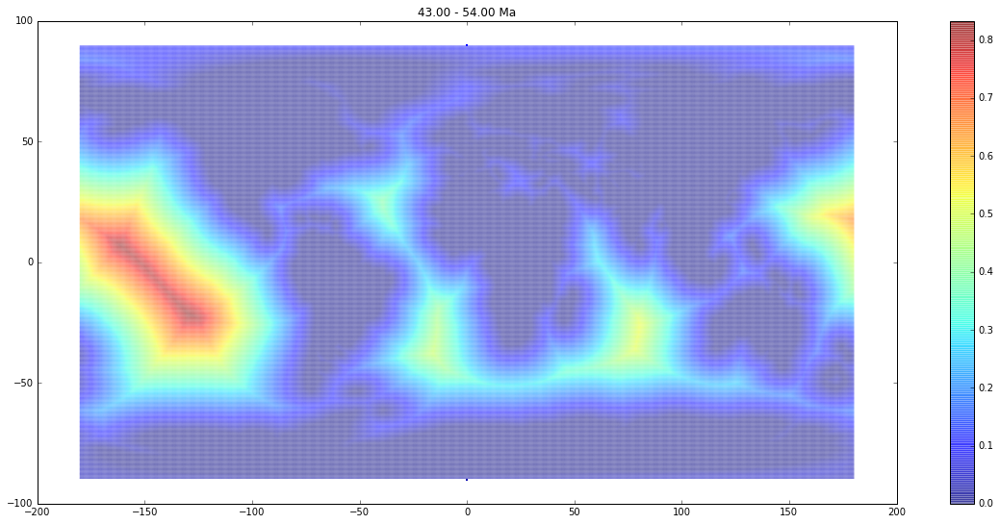

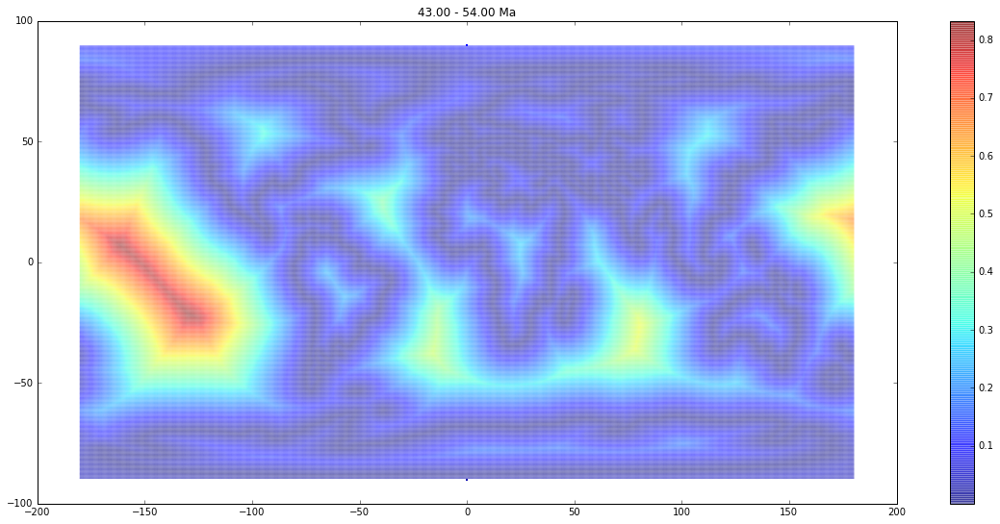

(82582,)
Working on interpolation from 54.00 Ma to 71.00 Ma .....


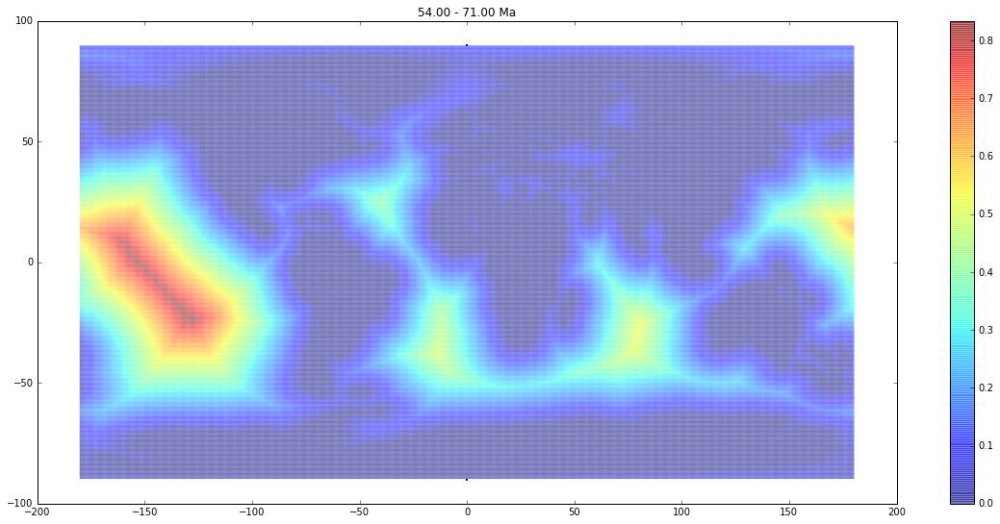

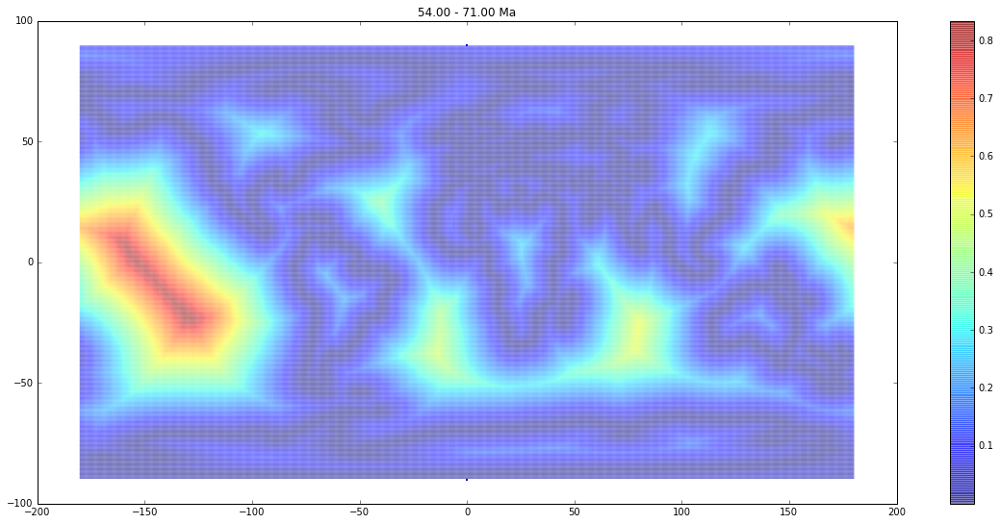

(83567,)
Working on interpolation from 71.00 Ma to 91.00 Ma .....


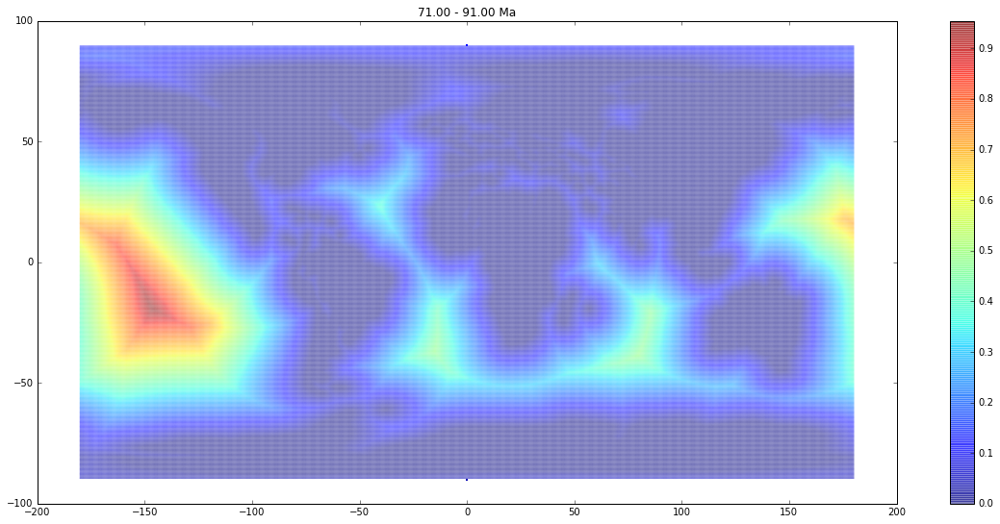

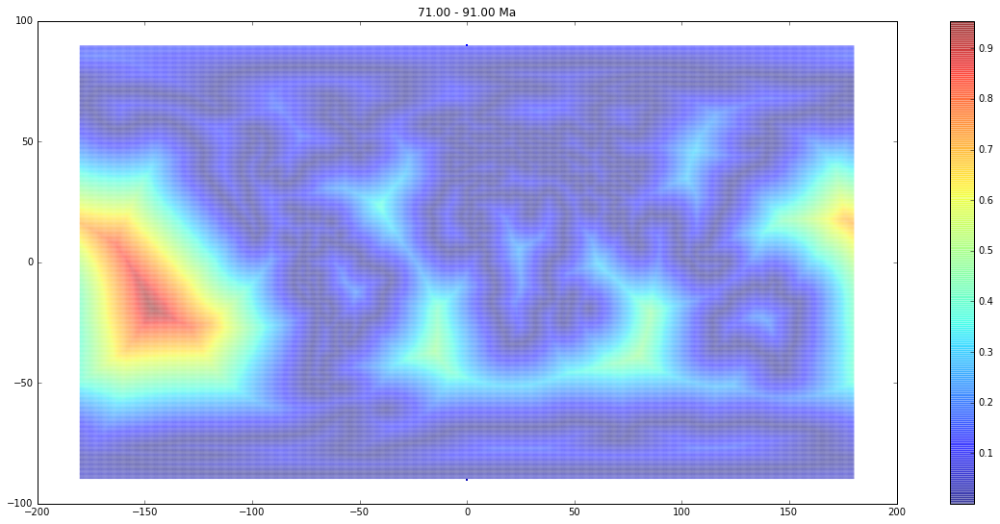

(78051,)
Working on interpolation from 91.00 Ma to 110.00 Ma .....


/Users/Simon/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:35: RuntimeWarning: invalid value encountered in divide


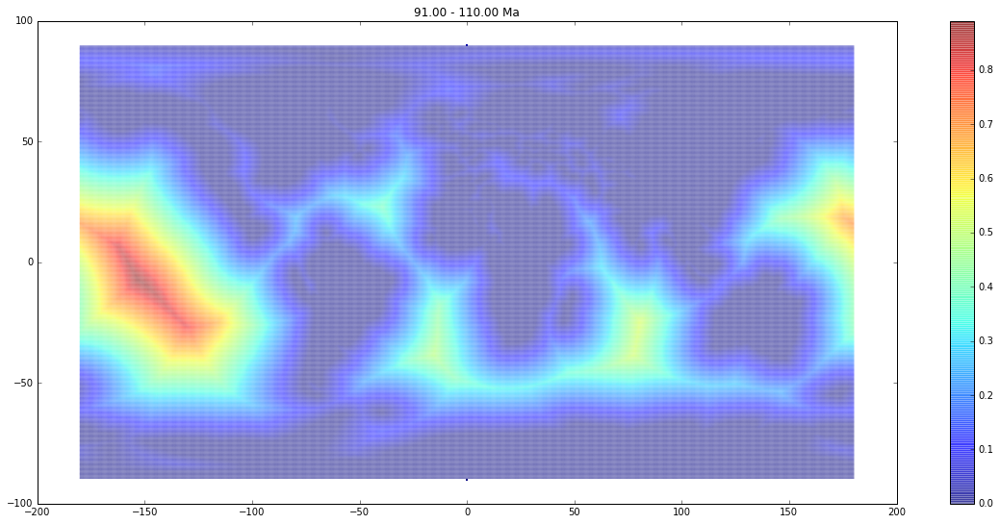

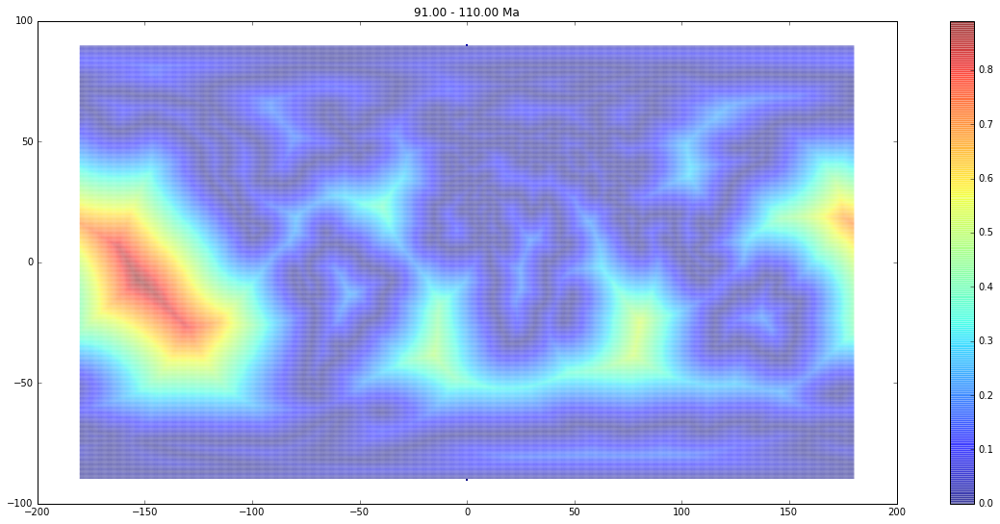

(77687,)
Working on interpolation from 110.00 Ma to 131.00 Ma .....


/Users/Simon/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:71: RuntimeWarning: invalid value encountered in less_equal
/Users/Simon/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:73: RuntimeWarning: invalid value encountered in greater_equal


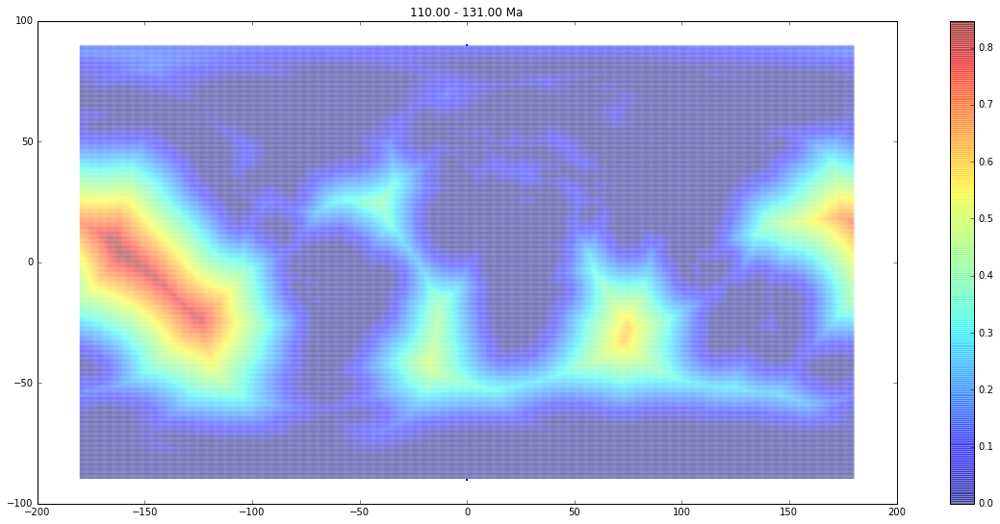

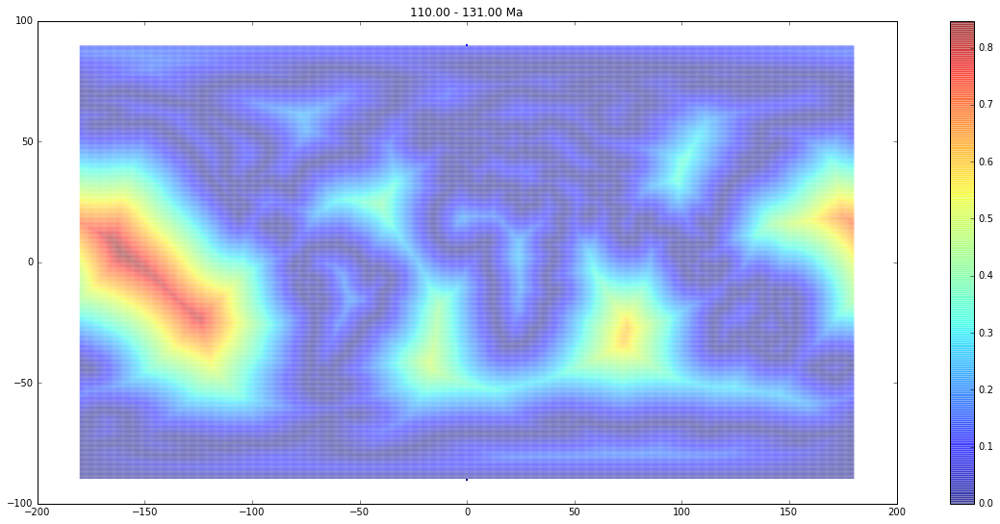

(82044,)
Working on interpolation from 131.00 Ma to 143.00 Ma .....


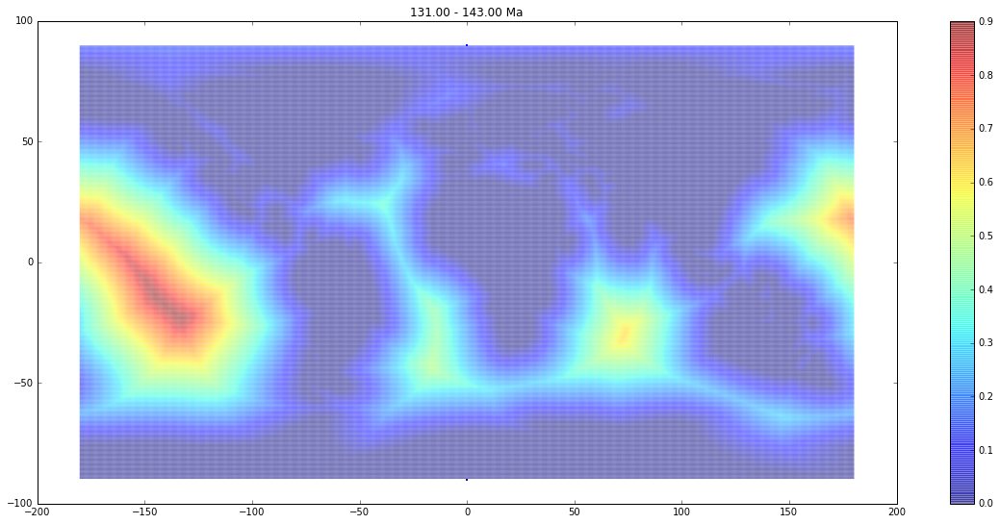

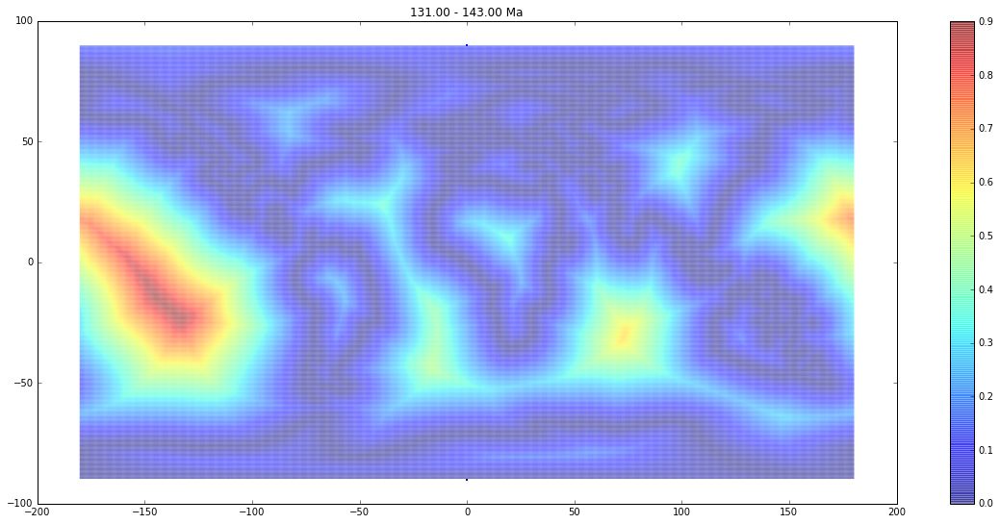

(81842,)


In [9]:
# actually the rotation file is completely irrelevant.....
base_dir = '/Applications/GPlates-2.0.0/SampleData/FeatureCollections/'
rotation_model=pygplates.RotationModel('%s/Rotations/Matthews_etal_GPC_2016_410-0Ma_GK07.rot' % base_dir)

# all paleoshorelines for different times are in one file - applying a reconstruction 
# will return just the polygons valid at the given time
psl = pygplates.FeatureCollection('/Users/Simon/Work/DynamicTopography/GR_Muller2016/Heine_AJES_15_GlobalPaleoshorelines-master/Global_Paleoshorelines_Golonka.gpml')


# run the process for the collection of paleoshorelines loaded previously
interpolate_paleoshoreline_collection(psl,rotation_model,sampling=0.5)


### Cells from here down are leftover from development phase, no longer working

In [5]:

# this mask is true where one (and only one) of the indicators is not zero
# --> delineates points that change environment between time steps
msk3 = np.logical_xor(distance_to_land_t1,distance_to_land_t2)

plt.figure(figsize=(20,9))
plt.plot(lons.flatten()[msk3],lats.flatten()[msk3],'k.',alpha=0.2)
plt.show()


NameError: name 'distance_to_land_t1' is not defined

In [4]:
# normalised distance derivation
# for each point, divide the distance to shoreline at t0 by the total distance to both shorelines
# --> if the point is halfway between the shorelines, value will be 0.5
#     if the point is closer to the t1 shoreline, the value will be less than 0.5
#     all values will be between 0 and 1
psl_dist_norm = np.divide(distance_to_psl_t1[msk3],(distance_to_psl_t1[msk3]+distance_to_psl_t2[msk3]))

#print psl_dist_normal

plt.figure(figsize=(20,9))
plt.scatter(lons.flatten()[msk3],lats.flatten()[msk3],
            c=psl_dist_norm,edgecolors='',s=2)
plt.colorbar()
plt.show()


NameError: name 'distance_to_psl_t1' is not defined

In [6]:
t_diff = (t2-t1)

for reconstruction_time in np.arange(t2,t1,-2):
    
    t_norm = (t2-reconstruction_time)/t_diff
    
    print t_norm
    
    plt.figure(figsize=(20,9))
    plt.scatter(lons.flatten()[msk3],lats.flatten()[msk3],
            c=psl_dist_norm>t_norm,edgecolors='',s=2)
    plt.colorbar()
    plt.show()
     
    

NameError: name 't2' is not defined